In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex, LinearSegmentedColormap
import folium
from folium import plugins
from matplotlib.colors import LinearSegmentedColormap
import branca

# Visualize the relationship between weather and rental volume

In [2]:
# Read the required csv file
df_date_Snow=pd.read_csv("df_date_Snow.csv")
df_date_Clear=pd.read_csv("df_date_Clear.csv")
df_date_Cloudy=pd.read_csv("df_date_Cloudy.csv")
df_date_Rain=pd.read_csv("df_date_Rain.csv")
df_date_Partially_cloudy=pd.read_csv("df_date_Partially_cloudy.csv")
df_date_Wind=pd.read_csv("df_date_Wind.csv")
df_date_rent_num=pd.read_csv("df_date_rent_num.csv")

In [3]:
# converts each datetime object to type `datetime64`
df_date_rent_num['datetime']=pd.to_datetime(df_date_rent_num['datetime'], format='%Y-%m-%d')
df_date_Snow['datetime']=pd.to_datetime(df_date_Snow['datetime'], format='%Y-%m-%d')
df_date_Clear['datetime']=pd.to_datetime(df_date_Clear['datetime'], format='%Y-%m-%d')
df_date_Cloudy['datetime']=pd.to_datetime(df_date_Cloudy['datetime'], format='%Y-%m-%d')
df_date_Rain['datetime']=pd.to_datetime(df_date_Rain['datetime'], format='%Y-%m-%d')
df_date_Partially_cloudy['datetime']=pd.to_datetime(df_date_Partially_cloudy['datetime'], format='%Y-%m-%d')
df_date_Wind['datetime']=pd.to_datetime(df_date_Wind['datetime'], format='%Y-%m-%d')

## Average rental volume by weather

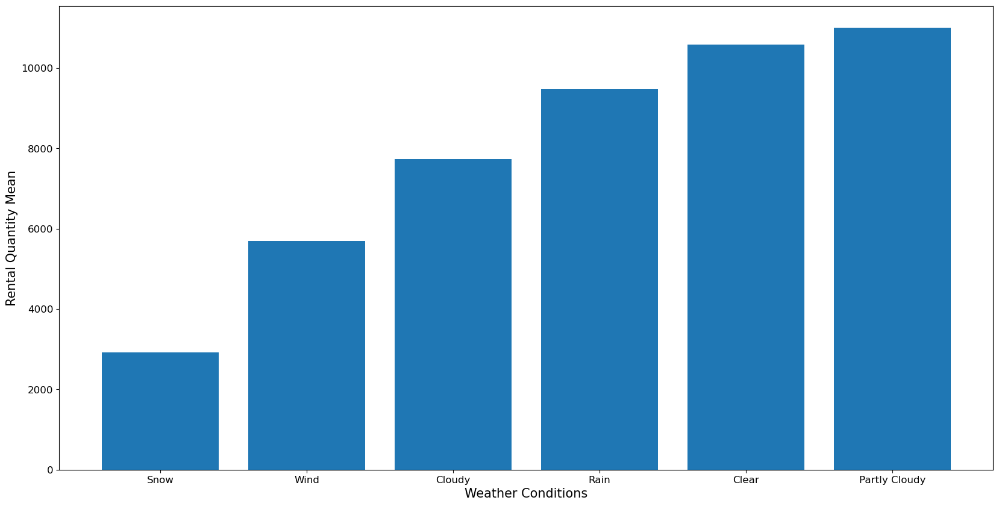

In [4]:
snowAvg = df_date_Snow['rental quantity'].mean()
clearAvg = df_date_Clear['rental quantity'].mean()
overcastAvg = df_date_Cloudy['rental quantity'].mean()
rainAvg = df_date_Rain['rental quantity'].mean()
partCloudAvg = df_date_Partially_cloudy['rental quantity'].mean()
windAvg = df_date_Wind['rental quantity'].mean()

weatherAvg = (snowAvg, windAvg, overcastAvg, rainAvg, clearAvg, partCloudAvg)
weatherAvgStr = ('Snow','Wind','Cloudy','Rain','Clear','Partly Cloudy')

plt.figure(figsize=(20, 10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.bar(weatherAvgStr, weatherAvg)
plt.xlabel('Weather Conditions',fontsize=15)
plt.ylabel('Rental Quantity Mean',fontsize=15)
plt.savefig('weather_avg.png')
plt.show()

## Rental volume by weather

In [5]:
x_Partially_cloudy=df_date_Partially_cloudy['datetime'].tolist()
y_Partially_cloudy=df_date_Partially_cloudy['rental quantity'].tolist()
x_Rain=df_date_Rain['datetime'].tolist()
y_Rain=df_date_Rain['rental quantity'].tolist()
x_Overcast=df_date_Cloudy['datetime'].tolist()
y_Overcast=df_date_Cloudy['rental quantity'].tolist()
x_Clear=df_date_Clear['datetime'].tolist()
y_Clear=df_date_Clear['rental quantity'].tolist()
x_Snow=df_date_Snow['datetime'].tolist()
y_Snow=df_date_Snow['rental quantity'].tolist()
x_Wind=df_date_Wind['datetime'].tolist()
y_Wind=df_date_Wind['rental quantity'].tolist()

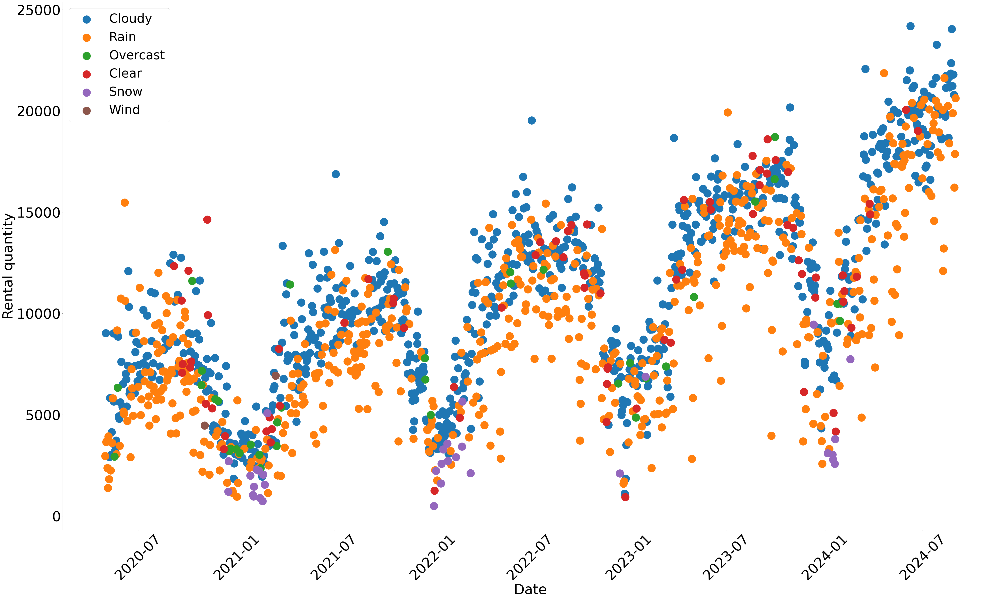

In [ ]:
plt.figure(figsize=(50, 30))
plt.scatter(x_Partially_cloudy, y_Partially_cloudy, label='Cloudy',s=800)
plt.scatter(x_Rain, y_Rain, label='Rain',s=800)
plt.scatter(x_Overcast, y_Overcast, label='Overcast',s=800)
plt.scatter(x_Clear, y_Clear, label='Clear',s=800)
plt.scatter(x_Snow, y_Snow, label='Snow',s=800)
plt.scatter(x_Wind, y_Wind, label='Wind',s=800)
plt.xlabel('Date',fontsize=50)
plt.ylabel('Rental quantity',fontsize=50)
plt.legend(fontsize=45)
plt.xticks(rotation=45,fontsize=50)
plt.yticks(fontsize=50)
plt.tight_layout()
plt.savefig('weather_rent_num.png')

# show picture
plt.show()

# Significance analysis of the impact of weather on rental volume

In [ ]:
# Group by category
category_partially_cloudy =df_date_Partially_cloudy['rental quantity']
category_rain = df_date_Rain['rental quantity']
category_clear_day = df_date_Clear['rental quantity']
category_cloudy = df_date_Cloudy['rental quantity']
category_snow = df_date_Snow['rental quantity']
category_wind = df_date_Wind['rental quantity']

In [8]:
from scipy.stats import f_oneway

In [ ]:
# One-way ANOVA
f_stat, p_value = f_oneway(category_partially_cloudy, category_rain, category_clear_day, category_cloudy, category_snow, category_wind)
print(f"F-statistic: {f_stat:.3f}, P-value: {p_value:.3f}")

# Interpretation of results
alpha = 0.05
if p_value < alpha:
    print("Differences between categories are statistically significant (reject the null hypothesis)")
else:
    print("The difference between different categories is not significant (the null hypothesis cannot be rejected)")

F-statistic: 26.840, P-value: 0.000
Differences between categories are statistically significant (reject the null hypothesis)


In [ ]:
# One-way ANOVA
categorys =[category_partially_cloudy, category_rain, category_cloudy, category_snow, category_wind]
weathers =['partially_cloudy', 'rain', 'cloudy', 'snow', 'wind']
width=20
for category, weather in zip(categorys, weathers):
    f_stat, p_value = f_oneway(category_clear_day, category)
    print(f"{weather:<{width}}F-statistic: {f_stat:.3f}, P-value: {p_value:.3f}")

partially_cloudy    F-statistic: 0.560, P-value: 0.454
rain                F-statistic: 4.024, P-value: 0.045
cloudy              F-statistic: 10.340, P-value: 0.002
snow                F-statistic: 87.119, P-value: 0.000
wind                F-statistic: 2.299, P-value: 0.134


# Total occupancy trends over the past four years

In [11]:
x_total=df_date_rent_num['datetime'].tolist()
y_total=df_date_rent_num['rental quantity'].tolist()

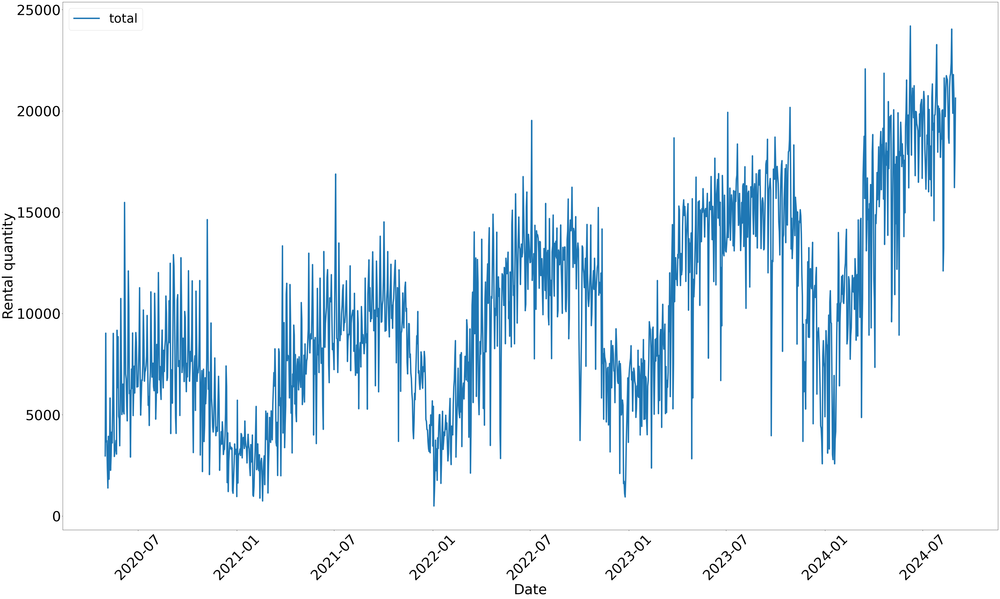

In [ ]:
plt.figure(figsize=(50, 30))
plt.plot(x_total, y_total, label='total',linewidth=5)
plt.xlabel('Date',fontsize=50)
plt.ylabel('Rental quantity',fontsize=50)
plt.legend(fontsize=45)
plt.xticks(rotation=45,fontsize=50)
plt.yticks(fontsize=50)
plt.tight_layout()
plt.savefig('total.png')

# show picture
plt.show()

## Gaussian smoothing

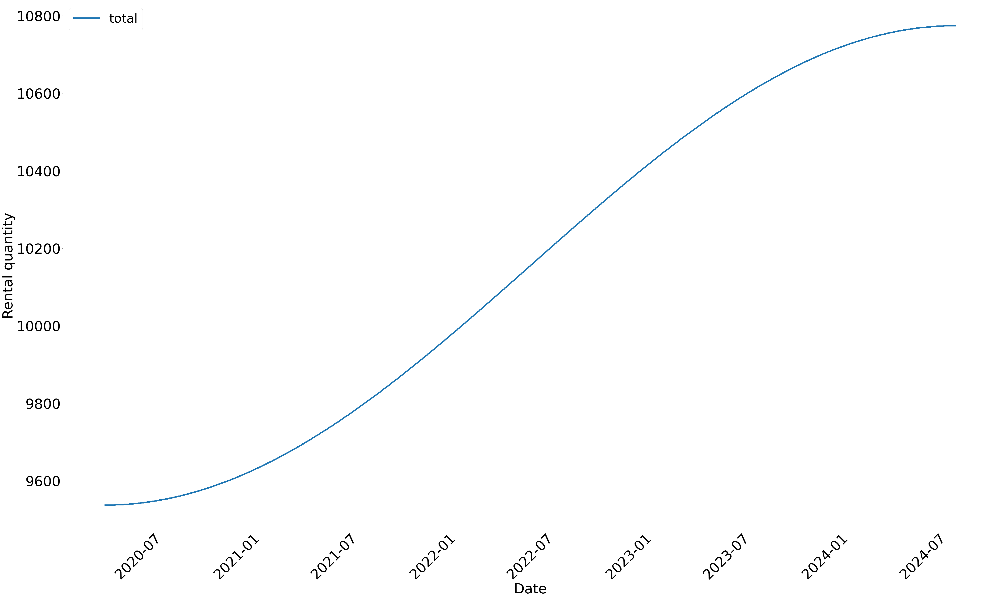

In [13]:
y_total_smoothed = gaussian_filter(y_total, sigma=1000)
plt.figure(figsize=(50, 30))
plt.plot(x_total, y_total_smoothed, label='total',linewidth=5)
plt.xlabel('Date',fontsize=50)
plt.ylabel('Rental quantity',fontsize=50)
plt.legend(fontsize=45)
plt.xticks(rotation=45,fontsize=50)
plt.yticks(fontsize=50)
plt.savefig('total_gaussian.png')
plt.tight_layout()

# Heat map visualization of the rental volume of each station over time

In [14]:
df_station_time=pd.read_csv("df_station_time.csv")

In [15]:
columns = df_station_time.columns.tolist()
new_df_station_time = df_station_time[columns[1:]]
new_df_station_time = new_df_station_time.groupby('started_time', as_index=False).sum()
new_df_station_time = new_df_station_time.set_index('started_time')

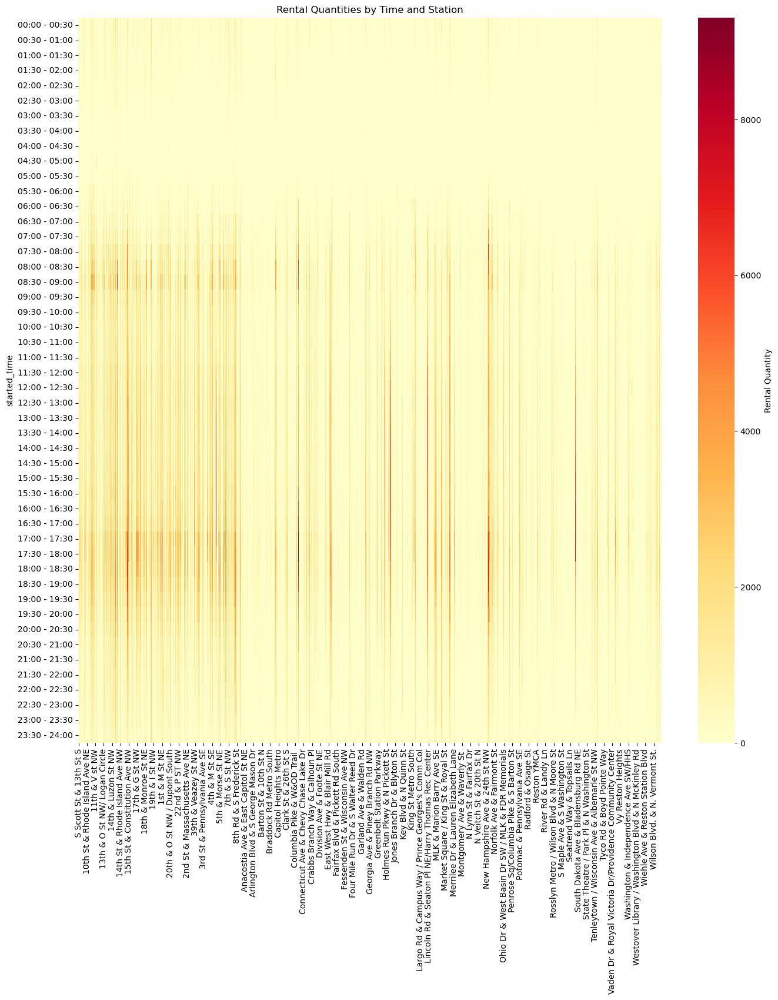

In [16]:
new_df_station_time_heatmap = new_df_station_time.copy()
plt.figure(figsize=(16, 16))
sns.heatmap(new_df_station_time_heatmap, cmap='YlOrRd', fmt='g', cbar_kws={'label': 'Rental Quantity'})
plt.title('Rental Quantities by Time and Station')
plt.savefig('new_heatmap_station_time.png', dpi=300, bbox_inches='tight')
plt.show()

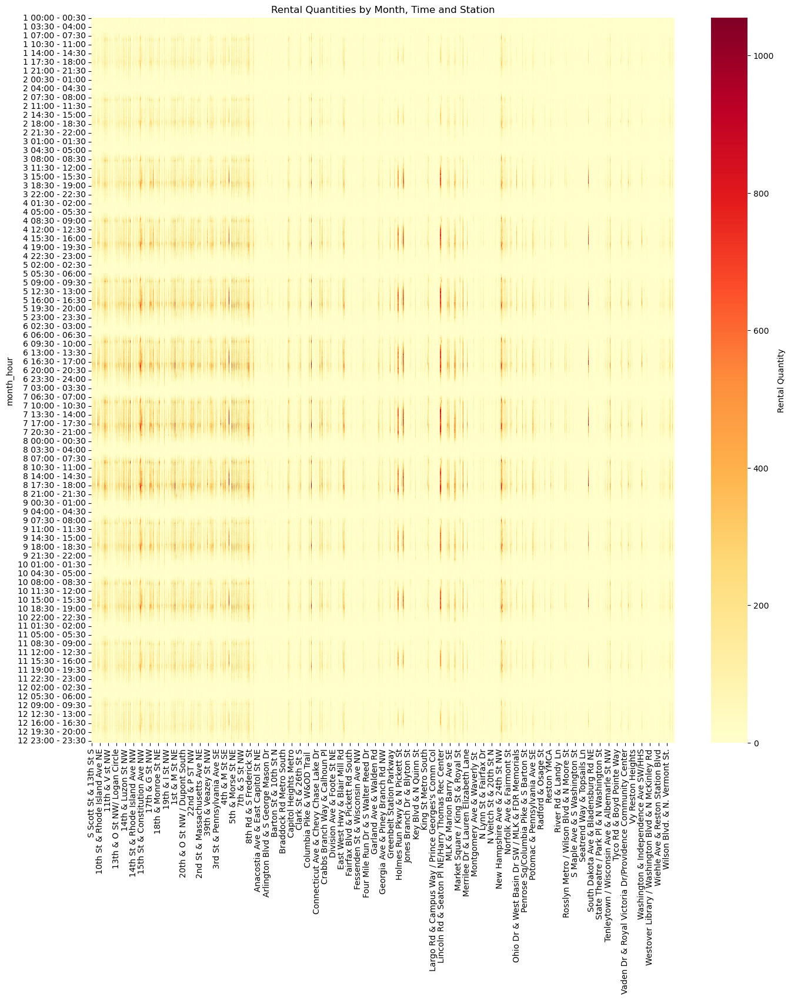

In [17]:
df_station_time_heatmap = df_station_time.copy()
df_station_time_heatmap['month_hour'] = df_station_time['month'].astype(str) + ' ' + df_station_time['started_time']
df_station_time_heatmap = df_station_time_heatmap.drop(columns=['month', 'started_time'])
df_station_time_heatmap = df_station_time_heatmap.set_index('month_hour')
df_station_time_heatmap = df_station_time_heatmap.astype(int)
plt.figure(figsize=(16, 16))
sns.heatmap(df_station_time_heatmap, cmap='YlOrRd', fmt='g', cbar_kws={'label': 'Rental Quantity'})
plt.title('Rental Quantities by Month, Time and Station')
plt.savefig('heatmap_station_time.png', dpi=300, bbox_inches='tight')
plt.show()

In [18]:
df_month_time=pd.read_csv("df_month_time.csv")

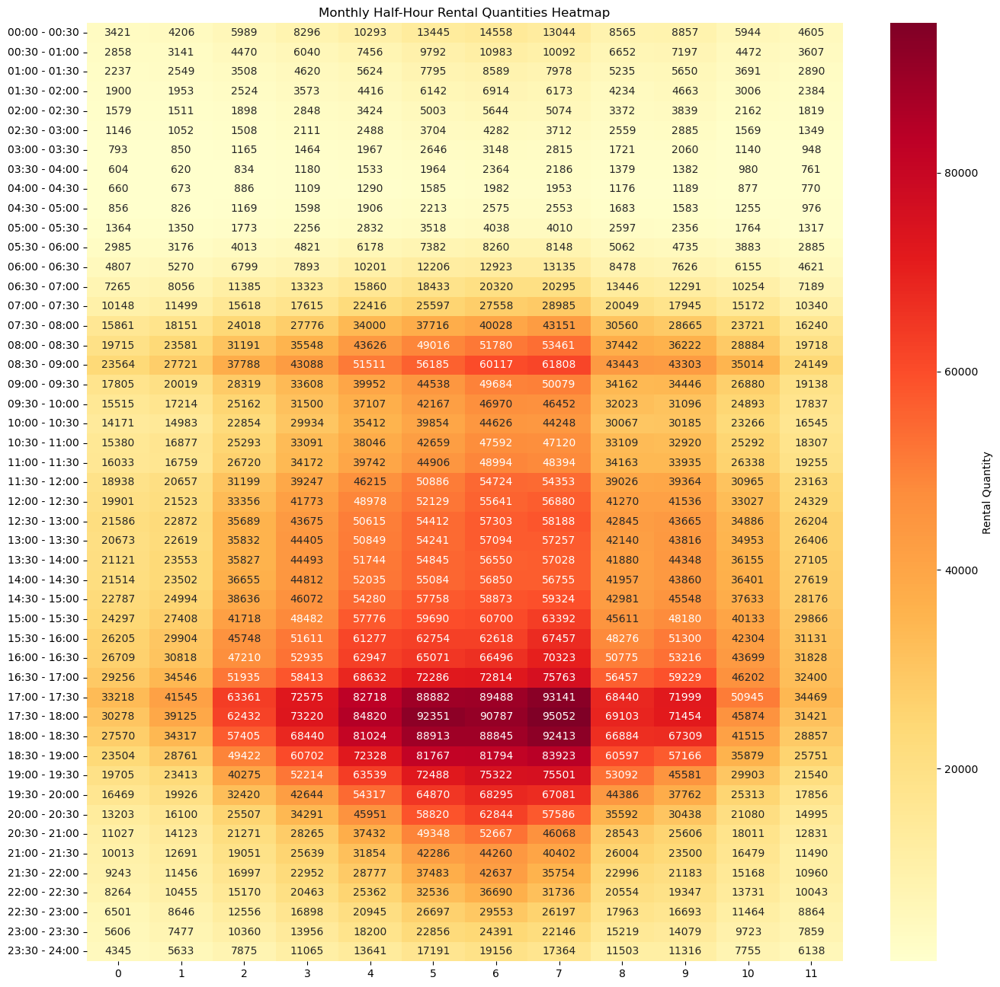

In [19]:
plt.figure(figsize=(16, 16))
sns.heatmap(df_month_time.transpose(), cmap="YlOrRd", annot=True, fmt='g', cbar_kws={'label': 'Rental Quantity'})
plt.title('Monthly Half-Hour Rental Quantities Heatmap')
plt.savefig('heatmap_rental_quantities.png', dpi=300, bbox_inches='tight') 
plt.show()

# Membership ratio analysis

In [20]:
df_member_casual=pd.read_csv("df_member_casual.csv")

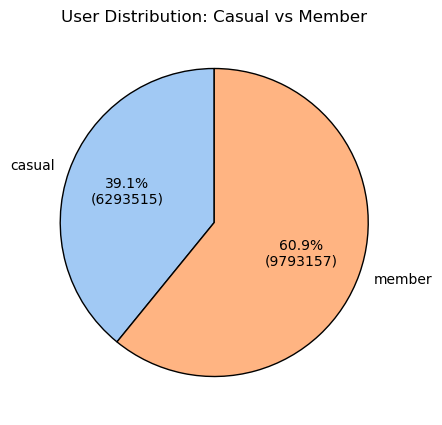

In [21]:
# Data
labels = df_member_casual['member_casual']
sizes = df_member_casual['count']

pastel_colors = sns.color_palette("pastel", n_colors=len(labels))

# Define a function to display both percentage and count
def func(pct, allvalues):
    absolute = int(pct / 100.*sum(allvalues))  # Calculate absolute value
    return f"{pct:.1f}%\n({absolute})"  # Format the label as percentage and count

# Plotting the pie chart
plt.figure(figsize=(5, 5))
plt.pie(sizes, labels=labels, autopct=lambda pct: func(pct, sizes), colors=pastel_colors, startangle=90, wedgeprops={'edgecolor': 'black'})

# Title
plt.title('User Distribution: Casual vs Member')

plt.savefig('member_barchart.png', dpi=300, bbox_inches='tight') 
# Show the plot
plt.show()

## Visualization of membership ratio of each station

In [22]:
df_member_start=pd.read_csv("df_member_start.csv")

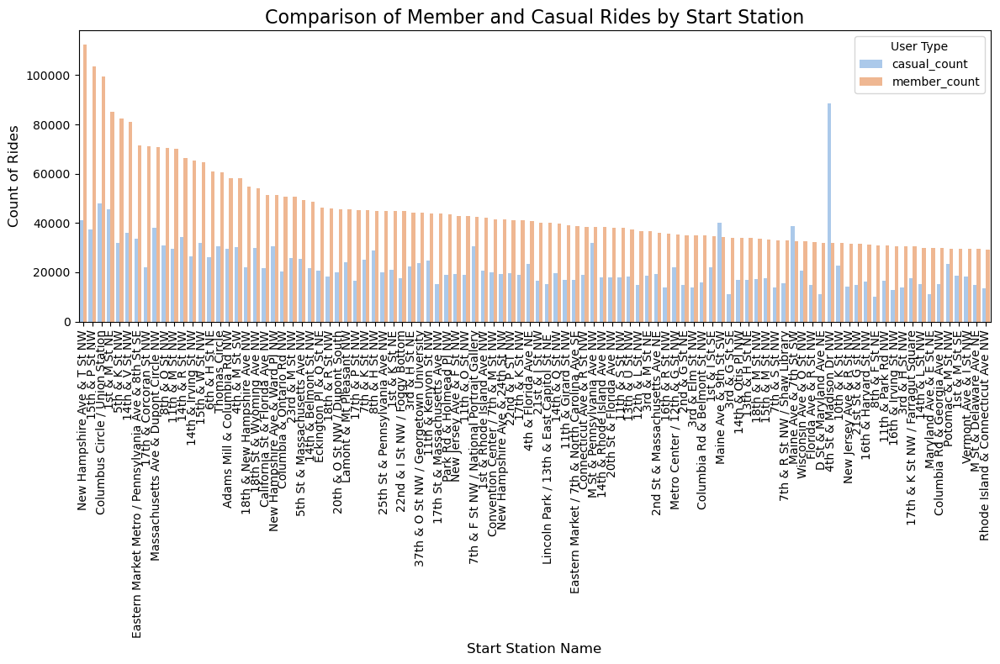

In [23]:
df_member_start_melted = df_member_start.head(100).melt(id_vars='start_station_name', 
                                                       value_vars=['casual_count', 'member_count'], 
                                                       var_name='member_casual', 
                                                       value_name='count')
plt.figure(figsize=(12, 8))
sns.barplot(data=df_member_start_melted, 
            x='start_station_name', 
            y='count', 
            hue='member_casual', 
            palette='pastel', 
            dodge=True)
plt.title('Comparison of Member and Casual Rides by Start Station', fontsize=16)
plt.xlabel('Start Station Name', fontsize=12)
plt.ylabel('Count of Rides', fontsize=12)
plt.xticks(rotation=90, fontsize=10)
plt.legend(title='User Type', fontsize=10)
plt.tight_layout()
plt.savefig('member_station.png', dpi=300, bbox_inches='tight') 
plt.show()

## Visualization of membership ratio of each station on the map

In [24]:
stats_with_type = pd.read_csv('stats_with_type.csv').dropna(subset=['avg_lat', 'avg_lng'])

In [25]:
map_center = [38.9078, -77.0369]

# Find the maximum and minimum values of start_count
max_count = stats_with_type['start_count'].max()
min_count = stats_with_type['start_count'].min()

# Normalization function to map start_count to a suitable range for display
def normalize_radius(count, min_count, max_count, min_radius=5, max_radius=200):
     # Normalize start_count to the range [min_radius, max_radius]
    return min_radius + (count - min_count) * (max_radius - min_radius) / (max_count - min_count)

palette = sns.color_palette("muted", n_colors=2)
member_color = palette[1]
casual_color = palette[0]

def get_color(member_count, casual_count):
    if member_count > casual_count:
        return to_hex(member_color)
    else:
        return to_hex(casual_color)

washington_map_member = folium.Map(location=map_center, zoom_start=13)

for _, row in stats_with_type.iterrows():
    station_name = row['station_name']
    lat = row['avg_lat']
    lng = row['avg_lng']
    start_count = row['start_count']
    member_count = row['start_member_count']
    casual_count = row['start_casual_count']

    radius = normalize_radius(start_count, min_count, max_count)

    fill_color = get_color(member_count, casual_count)

    circle_marker = folium.Circle(
        location=[lat, lng],
        radius=radius,
        color='transparent',
        fill=True,
        fill_color=fill_color,
        fill_opacity=0.8,
    ).add_to(washington_map_member)

    folium.Tooltip(
        f"{station_name}<br>Rides: {start_count}<br>Members: {member_count}<br>Casual: {casual_count}",
        sticky=True,
    ).add_to(circle_marker)

legend_html = """
<div style="position: fixed; 
            top: 10px; right: 10px; width: auto; height: auto; 
            background-color: rgba(255, 255, 255, 0.8); z-index:9999; font-size:14px;
            border:1px solid #ddd; border-radius: 5px; padding: 10px; box-shadow: 2px 2px 5px rgba(0,0,0,0.3);">
    <div style="margin-bottom: 5px; font-weight: bold;">Legend:</div>
    <i style="background: {member_color}; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Mostly Members<br>
    <i style="background: {casual_color}; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Mostly Casual
</div>
""".format(member_color=to_hex(member_color), casual_color=to_hex(casual_color))

washington_map_member.get_root().html.add_child(folium.Element(legend_html))

washington_map_member

In [26]:
washington_map_member.save("washington_map_member.html")

## Distribution of Ride Durations by Member and Casual

In [27]:
df_rent_duration = pd.read_csv('df_rent_duration.csv')

/var/folders/fw/lzdssnb90018371gm3r0tgph0000gn/T/ipykernel_7158/2925075366.py:1: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_rent_duration = pd.read_csv('df_rent_duration.csv')


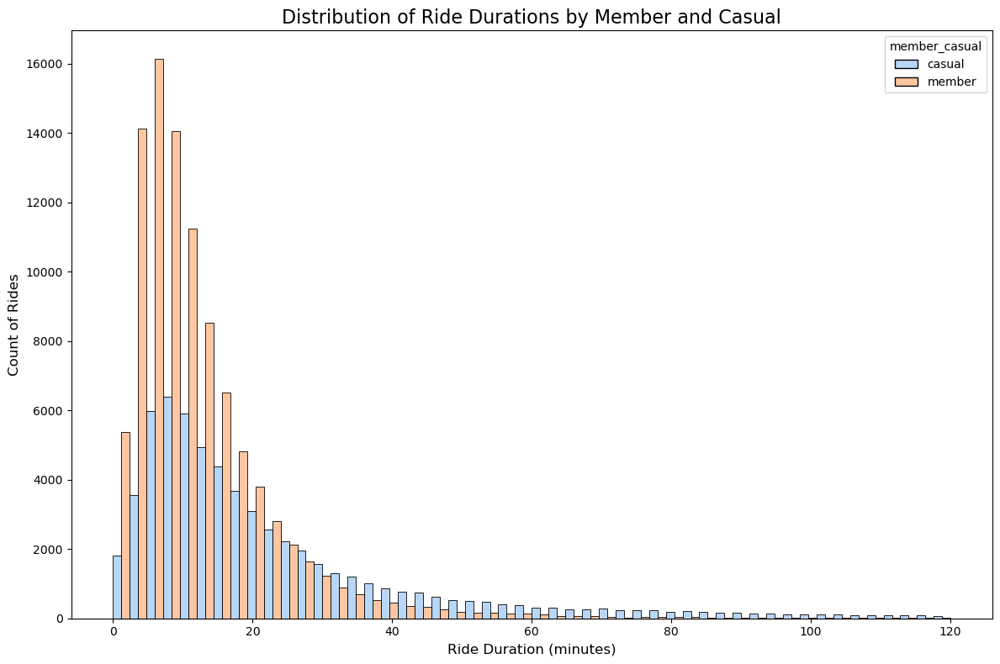

In [28]:
df_sample = df_rent_duration.sample(frac=0.01, random_state=42)

plt.figure(figsize=(12, 8))
sns.histplot(data=df_sample, x='ride_duration', hue='member_casual', multiple='dodge', bins=50, palette='pastel', hue_order=['casual', 'member']) 

plt.title('Distribution of Ride Durations by Member and Casual', fontsize=16)
plt.xlabel('Ride Duration (minutes)', fontsize=12)
plt.ylabel('Count of Rides', fontsize=12)

plt.tight_layout()
plt.savefig('Ride_duration.png', dpi=300, bbox_inches='tight') 
plt.show()

# Analysis of weather characteristics importance

In [29]:
df_date_weather_num = pd.read_csv('df_date_weather_num.csv')

In [30]:
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

In [ ]:
# Features and target variables
X = df_date_weather_num.iloc[:, 1:-1]
y = df_date_weather_num['rental quantity']

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the XGBoost regressor
xgb_model = XGBRegressor(
    n_estimators=1000,      # Number of trees
    learning_rate=0.01,     # Learning Rate
    max_depth=5,           # Maximum depth of the tree
    random_state=42
)

# Training the model
xgb_model.fit(X_train, y_train)

# predict
y_pred = xgb_model.predict(X_test)

# Calculate mean square error (MSE)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5

print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MSE: 4627447.087644517
RMSE: 2151.1501778454513


In [ ]:
# Get feature importance
importance = xgb_model.feature_importances_
features = X.columns

# Output Importance
for feature, score in zip(features, importance):
    print(f"Feature: {feature}, Importance: {score}")

Feature: tempmax, Importance: 0.03388049080967903
Feature: tempmin, Importance: 0.012917473912239075
Feature: temp, Importance: 0.04539528116583824
Feature: feelslikemax, Importance: 0.006318486295640469
Feature: feelslikemin, Importance: 0.045982446521520615
Feature: feelslike, Importance: 0.12540742754936218
Feature: dew, Importance: 0.006908854469656944
Feature: humidity, Importance: 0.006303189788013697
Feature: precip, Importance: 0.017374780029058456
Feature: precipprob, Importance: 0.0
Feature: precipcover, Importance: 0.03359576687216759
Feature: preciptype, Importance: 0.006663008593022823
Feature: snow, Importance: 0.0011690628016367555
Feature: snowdepth, Importance: 0.0022235941141843796
Feature: windgust, Importance: 0.00928246509283781
Feature: windspeed, Importance: 0.006737611256539822
Feature: winddir, Importance: 0.0067607685923576355
Feature: sealevelpressure, Importance: 0.006391626317054033
Feature: cloudcover, Importance: 0.008458642289042473
Feature: visibility, 

## Visualization of weather feature importance

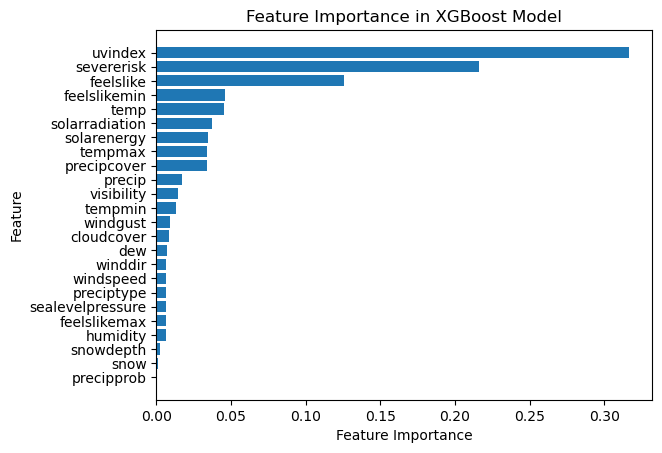

In [ ]:
sorted_idx = np.argsort(importance)  # Get the sorted index
sorted_features = [features[i] for i in sorted_idx]  # Sort features by index
sorted_importance = importance[sorted_idx]  # Sort importance by index
plt.barh(sorted_features, sorted_importance)
plt.xlabel("Feature Importance")
plt.ylabel("Feature")
plt.title("Feature Importance in XGBoost Model")
plt.savefig('Feature Importance XGBoost.png', dpi=300, bbox_inches='tight') 
plt.show()

## Visualization of weather feature importance errors

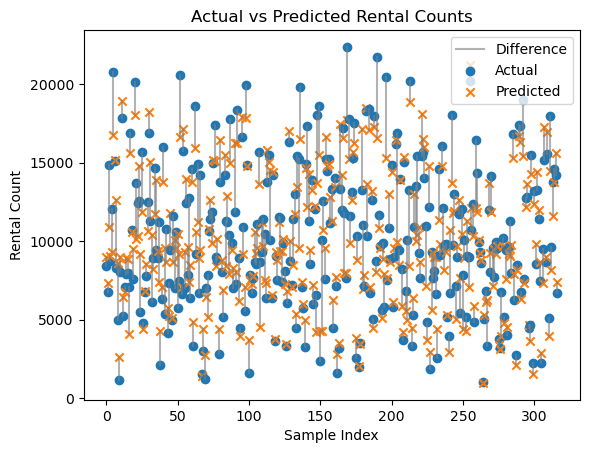

In [ ]:
# Traverse each sample point and connect the actual value and the predicted value
for i in range(len(y_test)):
    plt.plot([i, i], [y_test.values[i], y_pred[i]], color='gray', linestyle='-', alpha=0.6)  # Line connecting actual and predicted values
    plt.scatter(i, y_test.values[i], color='#1f77b4', marker='o')  # Plot actual value points
    plt.scatter(i, y_pred[i], color='#ff7f0e', marker='x')  # Plot predicted value points

plt.legend(['Difference', 'Actual', 'Predicted'])
plt.title("Actual vs Predicted Rental Counts")
plt.xlabel("Sample Index")
plt.ylabel("Rental Count")
plt.savefig('Actual vs Predicted Rental Counts.png', dpi=300, bbox_inches='tight') 
plt.show()

# Forecast future rental volume

In [35]:
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

Importing plotly failed. Interactive plots will not work.


In [36]:
df_pro = pd.read_csv('df_pro.csv')

In [37]:
df_pro

,ds,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,severerisk,y
0,2020-05-01,18.8,11.6,14.9,18.8,11.6,14.9,8.9,69.6,2.607,...,25.7,321.2,1008.5,66.7,16.0,111.8,9.5,6,0.0,2969
1,2020-05-02,22.1,11.1,16.3,22.1,11.1,16.3,6.4,54.0,0.000,...,26.1,246.4,1017.3,30.2,15.9,161.8,14.0,9,0.0,9028
2,2020-05-03,24.9,15.6,18.6,24.9,15.6,18.6,13.4,72.5,10.234,...,21.4,193.9,1010.2,71.7,15.2,67.2,5.7,4,0.0,3663
3,2020-05-04,23.8,14.3,19.2,23.8,14.3,19.2,7.8,53.8,15.555,...,44.9,317.0,1009.1,50.3,15.2,152.5,13.3,8,0.0,3718
4,2020-05-05,14.3,9.3,12.3,14.3,8.0,12.1,3.3,55.6,4.488,...,24.0,350.2,1014.5,81.0,15.2,57.0,5.0,2,0.0,2374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1579,2024-08-27,33.3,22.5,27.7,33.7,22.5,27.9,18.9,62.4,0.000,...,17.0,139.4,1018.8,40.4,15.1,207.7,18.1,8,10.0,21795
1580,2024-08-28,37.8,24.2,30.2,39.7,24.2,31.9,20.4,58.7,0.000,...,23.1,219.7,1016.2,70.3,16.0,194.8,16.9,7,10.0,20796
1581,2024-08-29,32.8,23.3,28.1,38.1,23.3,30.3,21.9,69.7,12.655,...,23.3,60.9,1019.4,73.8,14.9,133.6,11.5,8,60.0,16217
1582,2024-08-30,23.8,22.2,22.9,23.8,22.2,22.9,20.8,87.6,6.238,...,19.8,60.9,1022.0,99.2,12.8,39.6,3.4,2,10.0,17877


In [38]:
df_pro['ds']=pd.to_datetime(df_pro['ds'], format='%Y-%m-%d')

In [ ]:
# 2. Defining the Prophet Model
model = Prophet()

# Add all weather-related regressors
weather_features = [
    "uvindex",
    "severerisk",
    "feelslike",
    "solarenergy",
    "temp",
    "feelslikemin",
    "tempmax",
    "solarradiation",
    "precipcover",
    "tempmin",
    "precip",
    "visibility",
    "preciptype",
    "cloudcover",
    "windspeed",
]

# Add each feature as a regressor in Prophet
for feature in weather_features:
    model.add_regressor(feature)


# 3. Split the dataset into training and testing sets
train_size = int(len(df_pro) * 0.8)  # 80% training set, 20% test set
train_data = df_pro[:train_size]
test_data = df_pro[train_size:]

# 4. Training the model
model.fit(train_data)

19:30:05 - cmdstanpy - INFO - Chain [1] start processing
19:30:06 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
# 6. Making predictions
forecast = model.predict(test_data)

## Loss visualization

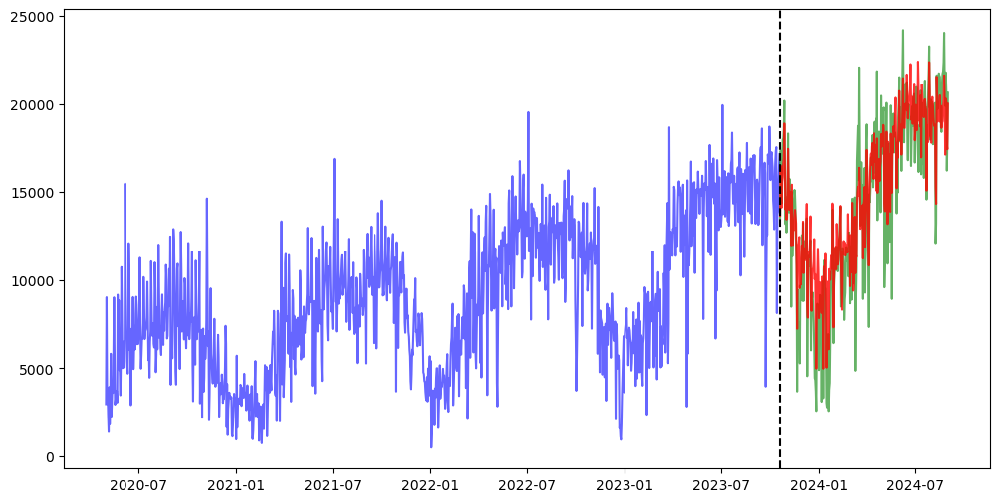

In [ ]:
# 8. Plot a comparison of the training and test sets
plt.figure(figsize=(12, 6))

# Training set true value
plt.plot(train_data['ds'], train_data['y'], label='Train Set', color='blue', alpha=0.6)

# Testing set true value
plt.plot(test_data['ds'], test_data['y'], label='Test Set', color='green', alpha=0.6)

# Predicted value
plt.plot(forecast['ds'], forecast['yhat'], label='Predicted Value', color='red', alpha=0.8)

# Mark the training and test set split
plt.axvline(x=test_data['ds'].iloc[0], color='black', linestyle='--', label='Train-Test Boundary')

plt.savefig('Prophet_result.png', dpi=300, bbox_inches='tight') 

In [ ]:
# Take the part of the test set corresponding to the predicted value
y_true = test_data['y']
y_pred = forecast.iloc[-len(test_data):]['yhat']

# Calculating evaluation metrics
mse = mean_squared_error(y_true, y_pred)
mae = mean_absolute_error(y_true, y_pred)
r2 = r2_score(y_true, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"R² Score: {r2}")

Mean Squared Error (MSE): 3907222.9902083008
Mean Absolute Error (MAE): 1458.3266245041264
R² Score: 0.8432569983242107


# Analysis of the optimal bicycle distribution strategy

In [43]:
df_start_percentage = pd.read_csv('start_percentage.csv')
del df_start_percentage['month']

## Visualization of the optimal bicycle distribution strategy

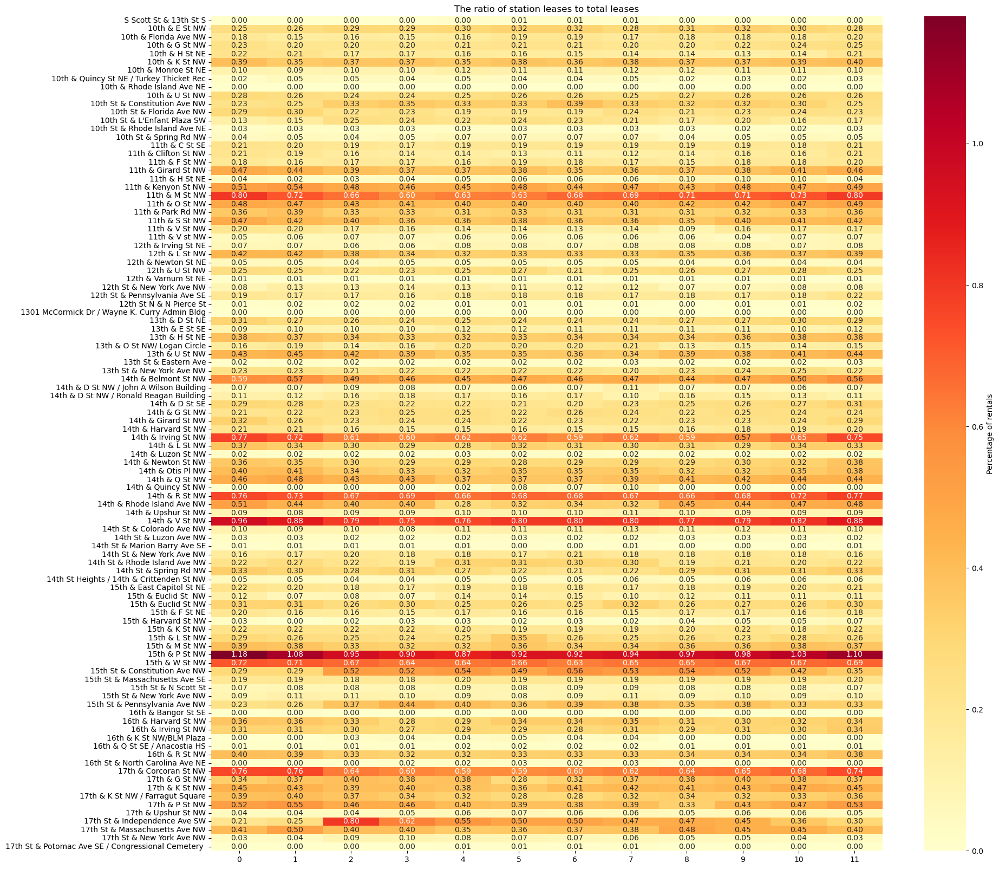

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(
    df_start_percentage.iloc[:, 0:100].transpose(),  # data
    cmap='YlOrRd',        # Colormap
    annot=True,           # Label the data in each grid
    fmt=".2f",            # Format data (two decimal places)
    cbar_kws={'label': 'Percentage of rentals'},  # color
    annot_kws={"size": 10}  # Grid data font size
)
plt.title('The ratio of station leases to total leases')
plt.savefig('Percentage of rentals.png', dpi=300, bbox_inches='tight')
plt.show()

## Visualization of the optimal bicycle dispatching strategy

In [45]:
df_Difference=pd.read_csv('Difference.csv')
del df_Difference['month']

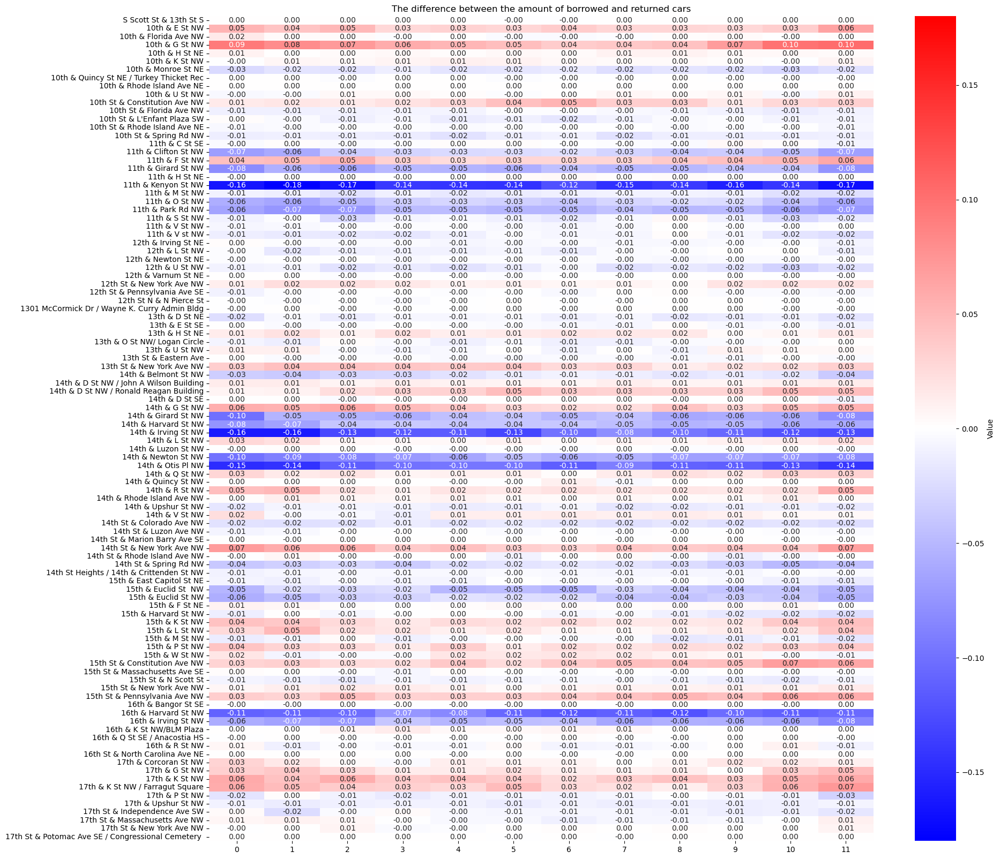

In [ ]:
plt.figure(figsize=(20, 20))
custom_cmap = LinearSegmentedColormap.from_list(
    "RedBlue", [(0, "blue"), (0.5, "white"), (1, "red")]
)
sns.heatmap(
    df_Difference.iloc[:,0:100].transpose(),  # data
    cmap=custom_cmap,      # Customize red and blue gradient colors
    annot=True,            # Label the data in each grid
    fmt=".2f",             # Format data to 2 decimal places
    cbar_kws={'label': 'Value'},  # Set the color bar labels
    center=0,              # Set the color center to 0
    vmin=-np.max(np.abs(df_Difference.values)),  # Ensure color symmetry
    vmax=np.max(np.abs(df_Difference.values)),  
    annot_kws={"size": 10}  # Font size of data in grid
)
plt.title('The difference between the amount of borrowed and returned cars')
plt.savefig('Difference.png', dpi=300, bbox_inches='tight')
plt.show()

In [47]:
df_Difference_mean = df_Difference.mean(axis=0)
df_Difference_mean.index.name = 'station_name'

In [48]:
stats_with_type = pd.read_csv('stats_with_type.csv')

In [49]:
stats_with_type = stats_with_type.dropna(subset=['avg_lat', 'avg_lng'])

In [50]:
stats_with_diff = stats_with_type.set_index('station_name')
stats_with_diff['average_difference'] = df_Difference_mean.loc[stats_with_diff.index]

## Visualization of the optimal bicycle dispatching strategy on the map

In [ ]:
washington_map_in_out = folium.Map(location=map_center, zoom_start=13)

# Compute the maximum and minimum values ​​of df_Difference so that they line up in the colormap
max_diff = np.max(np.abs(stats_with_diff.average_difference))  # Maximum difference
min_diff = -max_diff  # Symmetrical minimum difference

# Create a gradient colormap to represent the difference in value
colormap = branca.colormap.LinearColormap(
    colors=["blue", "white", "red"],  # Range of the color map
    vmin=min_diff,                   # min
    vmax=max_diff,                   # max
    caption="Difference"             # Color bar title
)

# colormap.add_to(washington_map_in_out)

legend_html = """
<div style="position: fixed; 
            top: 10px; right: 10px; width: auto; height: auto; 
            background-color: rgba(255, 255, 255, 0.7); z-index:9999; font-size:14px;
            border:1px solid #ddd; border-radius: 5px; padding: 10px; box-shadow: 2px 2px 5px rgba(0,0,0,0.3);">
    <i style="background: blue; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Outflow<br>
    <i style="background: red; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Inflow
</div>
"""
washington_map_in_out.get_root().html.add_child(folium.Element(legend_html))

# Traverse each site, get its corresponding data and add a marker on the map
for _, row in stats_with_type.iterrows():
    station_name = row['station_name']
    lat = row['avg_lat']
    lng = row['avg_lng']
    start_count = row['start_count']
    station_type = row['type']

    # Get the difference value and determine the color based on the difference value
    diff_value = df_Difference[station_name].mean()  # Mean for each site (obtained from df_Difference)
    
    # Use the gradient color bar to get the corresponding color
    color = colormap(diff_value)  # Get the color corresponding to the difference value

    if diff_value > 0:
        border_color = 'red'
    else:
        border_color = 'blue'

    # Use normalized counts as radius
    radius = normalize_radius(start_count, min_count, max_count)
    
    # Create a circular marker
    circle_marker = folium.Circle(
        location=[lat, lng],
        radius=radius,  # radius
        color=border_color,  # Circle border color
        weight=0.8,
        opacity=0.8,
        fill=True,  # Filled Circle
        fill_color=color,  # Fill color, based on the difference value
        fill_opacity=0.6,  # Fill transparency
    ).add_to(washington_map_in_out)
    
    # Add Tooltip to display the station name and the borrowing difference value
    folium.Tooltip(f"{station_name}<br>Difference: {diff_value:.2f}", sticky=True).add_to(circle_marker)

# show map
washington_map_in_out

In [52]:
washington_map_in_out.save("washington_map_in_out.html")

# Number of bicycles rented at different types of stations

In [53]:
df_rent = pd.read_csv("sources/daily_rent_detail.csv")

/var/folders/fw/lzdssnb90018371gm3r0tgph0000gn/T/ipykernel_7158/3483127896.py:1: DtypeWarning: Columns (5,7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_rent = pd.read_csv("sources/daily_rent_detail.csv")


In [54]:
df_station_class = pd.read_csv("sources/stations.csv")
df_station_end = df_rent['end_station_name'].value_counts()
df_station_start = df_rent['start_station_name'].value_counts()
new_df_station_end = pd.DataFrame(df_station_end)
new_df_station_end = new_df_station_end.reset_index()
new_df_station_end.columns = ['stations','number']
new_df_station_end_type = pd.merge(new_df_station_end, df_station_class[['stations','type']], on='stations', how='left')
new_df_station_end_type['start/end'] = 'end'
new_df_station_start = pd.DataFrame(df_station_start)
new_df_station_start = new_df_station_start.reset_index()
new_df_station_start.columns = ['stations','number']
new_df_station_start_type = pd.merge(new_df_station_start, df_station_class[['stations','type']], on='stations', how='left')
new_df_station_start_type['start/end'] = 'start'
new_df_station_start_end_type = pd.concat([new_df_station_end_type, new_df_station_start_type], axis=0)

/var/folders/fw/lzdssnb90018371gm3r0tgph0000gn/T/ipykernel_7158/644991851.py:4: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


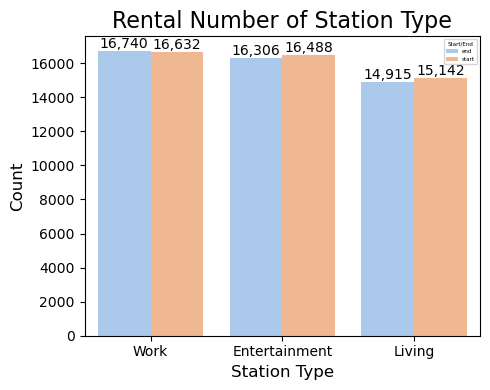

In [ ]:
plt.figure(figsize=(5, 4))

# Use Seaborn's barplot to draw a bar chart and get the axis object
ax = sns.barplot(
    data=new_df_station_start_end_type,
    x='type',
    y='number',
    hue='start/end',
    palette='pastel',
    ci=None
)

# Setting the chart title and axis labels
plt.title('Rental Number of Station Type', fontsize=16)
plt.xlabel('Station Type', fontsize=12)
plt.ylabel('Count', fontsize=12)

# Set the font size and rotation of the x-axis tick labels
plt.xticks(fontsize=10)

# Add value labels
for p in ax.patches:
    ax.annotate(format(int(p.get_height()), ','),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 5),
                textcoords='offset points')

# Optimize legend
plt.legend(title='Start/End', fontsize=4, title_fontsize=4)

# Automatically adjust layout
plt.tight_layout()

plt.savefig('Station_Type_rent.png', dpi=300, bbox_inches='tight') 

# show picture
plt.show()

## Visualization of the number of bicycle rentals at different types of stations on the map

In [56]:
washington_map_type = folium.Map(location=map_center, zoom_start=13)

type_colors = {
    "Work": "blue",
    "Living": "green",
    "Entertainment": "red",
}

for _, row in stats_with_type.iterrows():
    station_name = row['station_name']
    lat = row['avg_lat']
    lng = row['avg_lng']
    start_count = row['start_count']
    station_type = row['type']

    # Determine the color based on station type, default to gray
    color = type_colors.get(station_type, "gray")
    
    radius = normalize_radius(start_count, min_count, max_count)
    
    # Create a circle marker
    circle_marker = folium.Circle(
        location=[lat, lng],
        radius=radius,  # Radius
        color='transparent',  # Circle border color
        fill=True,  # Fill the circle
        fill_color=color,  # Fill color
        fill_opacity=0.6,  # Fill opacity
    ).add_to(washington_map_type)
    
    folium.Tooltip(f"{station_name}<br>Rides: {start_count}", sticky=True).add_to(circle_marker)

# Add a legend to the map
legend_html = """
<div style="position: fixed; 
            top: 10px; right: 10px; width: auto; height: auto; 
            background-color: rgba(255, 255, 255, 0.8); z-index:9999; font-size:14px;
            border:1px solid #ddd; border-radius: 5px; padding: 10px; box-shadow: 2px 2px 5px rgba(0,0,0,0.3);">
    <i style="background: blue; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Work<br>
    <i style="background: green; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Living<br>
    <i style="background: red; width: 12px; height: 12px; display: inline-block; margin-right: 5px; border-radius: 50%;"></i> Entertainment
</div>
"""
washington_map_type.get_root().html.add_child(folium.Element(legend_html))

# Display the map
washington_map_type

In [57]:
washington_map_type.save("washington_map_type.html")